In [1]:
## Standard imports
import numpy as np
import matplotlib.pyplot as plt
import os

import torch
from torch.utils.data import DataLoader
import torch.nn.functional as F

from absl import flags

In [2]:
## Relative imports
from dataHandler.dataset import MHDProjDataset,LogNormalTransform

from ddpm.model import UNet, ResUNet
from ddpm.diffusion import DDPM, generate_image, NCSN, SigmaDDPM

from validationMetrics.powerSpectrum import power_spectrum_iso, plot_ps
from validationMetrics.minkowskiFunctional import plot_mink_functionals

from utils.scheduler import WarmUp 

In [3]:
import torch.nn as nn

In [4]:
MODEL_ID = 'MHDsame_SigmaDDPM_skip_GN_bottleneck32_diffusion1000_wd1e-4_csize6'
MODEL_ID = 'MHD_SigmaDDPM_test_CMB'
CKPT_FOLDER = '/mnt/home/dheurtel/ceph/10_checkpoints/artificial_architecture_exps' #For checkpoints and losses

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [86]:
FLAGS=flags.FLAGS
try:
    flags.DEFINE_string('model_id','MHD_DDPM_forget',help= 'ID of the model either trained, finetuned, evaluated....')

    ## Data & transforms
    flags.DEFINE_string('source_dir','/mnt/home/dheurtel/ceph/00_exploration_data/density/b_proj',help= 'Source dir containing a list of npy files')
    flags.DEFINE_bool('random_rotate', True, help='')
    flags.DEFINE_bool('no_lognorm', False, help='apply a lognormal transformation to the dataset')

    ## Network & diffusion parameters

    flags.DEFINE_enum('diffusion_mode', 'ddpm', ['ddpm', 'smld', 'VE', 'VD', 'sub_VP', 'SigmaDDPM'], help='Type of diffusion SDE used during training and inference')
    ## TODO if we want to fully use the SDE/ score based framework (and have custom/off the shelf SDE solvers, we will nedd to use runners/differentiate the training loop)
    # For DDPM
    flags.DEFINE_integer('n_steps', 1000, help= 'Diffusion total time see Ho, J., Jain, A., & Abbeel, P. (2020). Denoising diffusion probabilistic models')
    flags.DEFINE_float('beta_start', 1e-4, help = 'Beta at time 0 see Ho, J., Jain, A., & Abbeel, P. (2020). Denoising diffusion probabilistic models')
    flags.DEFINE_float('beta_T',0.02, help= 'Beta at time T=n_steps Ho, J., Jain, A., & Abbeel, P. (2020). Denoising diffusion probabilistic models')
    flags.DEFINE_string("power_spectrum", '/mnt/home/dheurtel/ceph/00_exploration_data/power_spectra/power2.npy', help = "Power Spectrum file")

    #Unet
    flags.DEFINE_enum('network', 'unet', ['unet', 'ResUNet'], help='DUNet not yet implemented')
    flags.DEFINE_integer('size',256, help='height and width of the images')
    flags.DEFINE_integer('in_channel', 1, help= 'number of channel on input and output images')
    flags.DEFINE_enum('normalization', 'LN' , ['LN' , 'default', 'LN-D', 'LN-F', 'LN-F+', 'LN-DF', 'BN', 'BN/LN', 'BN/FLN', 'BN/F+LN', 'DBN/LN', 'GN', 'DN','None'], help= 'type of normalization applied') ## TODO upcoming cleaning of these options based on elimination and perceived redundancies
    flags.DEFINE_float('eps_norm', 1e-5, help= 'epsilon value added to the variance in the normalization layer to ensure numerical stability')
    flags.DEFINE_integer('size_min', 32, help= 'size at the bottleneck')
    flags.DEFINE_integer('num_blocks', 1, help= 'num of blocks per size on descent')
    flags.DEFINE_enum('padding_mode', 'circular' ,['zeros', 'reflect', 'replicate','circular'], help='Conv2d padding mode')
    flags.DEFINE_bool('muP', False, help= 'Use mu Parametrisation for initialisation and training') ## TODO 
    flags.DEFINE_float('dropout', 0, help= 'Probability for dropout, we did not find any impact because our models tend not to overfit')
    flags.DEFINE_integer('first_c_mult', 10, help= 'Multiplier between in_c and out_c for the first block')
    flags.DEFINE_bool('skip_rescale', False, help='Rescale skip connections (see Score Based Generative Modelling paper)')

    ## Training parameters 
    flags.DEFINE_integer('batch_size', 64, help='Dataloader batch size')
    flags.DEFINE_integer('num_sample', 8, help='Number of sample for an epoch in the middle')
    flags.DEFINE_integer('num_result_sample', 256, help='Number of sample for an epoch in the middle')
    flags.DEFINE_float('lr', 1e-3, help= 'Learning rate')
    flags.DEFINE_enum('lr_scheduler', 'None', ['None','stepLR'], help='scheduler, if any used in training')
    flags.DEFINE_integer('warmup', 100, help='Length of warmup, if 0 then no warmup')
    flags.DEFINE_integer('test_set_len', 95, help='')
    flags.DEFINE_integer('num_epochs', 500, help='Number of epochs')
    flags.DEFINE_enum('optimizer', 'Adam', ['AdamW', 'Adam', 'MoMo'], help='MoMo not implemented in particular for now') ## TODO MoMo 
    flags.DEFINE_float('weight_decay', 0.0, help= 'Weight decay hyper parameter')
    flags.DEFINE_float('ema', 0.0, help='Exponentially moving average momentum, if 0 then no ema applied NOT IMPLEMENTED yet ')  ## TODO

    ## Sampling and checkpointing
    flags.DEFINE_integer('save_step_epoch', 100, help='Period in nb of epochs for saving ckpt & losses')
    flags.DEFINE_integer('sample_step_epoch', 100, help='Period in nb of epoch for generating a few npy samples')
    flags.DEFINE_string('sample_folder','/mnt/home/dheurtel/ceph/20_samples/artificial_architecture_exps',help= 'directory where generated samples (in the middle of training) or results are stored')
    flags.DEFINE_string('ckpt_folder','/mnt/home/dheurtel/ceph/10_checkpoints/artificial_architecture_exps',help= 'Directory for ckpt & loss storage (as well as some training specs)')


except:
    print("Flags already defined but you can still re-parse them with next few cells")

Flags already defined but you can still re-parse them with next few cells


In [87]:
def extract_flag_name(str):
    pref='--'
    suff='='
    try:
        idx1 = str.index(pref)
        idx2 = str.index(suff)
    except:
        try:
            idx1 = str.index(pref)
            idx2=len(str)
        except:
            return None
    return str[idx1 + len(pref): idx2]


In [88]:
with open(os.path.join(CKPT_FOLDER, MODEL_ID, 'flagfile.txt')) as f:
    lines = f.read().splitlines()

print(lines)

lines=[s for s in lines if (extract_flag_name(s) in FLAGS) or (extract_flag_name(s)[2:] in FLAGS and extract_flag_name(s)[:2]=='no')]

print(lines)

FLAGS(lines)

['--nohelp', '--nohelpfull', '--nohelpshort', '--nohelpxml', '--noonly_check_args', '--nopdb', '--nopdb_post_mortem', '--norun_with_pdb', '--norun_with_profiling', '--use_cprofile_for_profiling', '--noalsologtostderr', '--log_dir=', '--logger_levels=', '--nologtostderr', '--showprefixforinfo', '--stderrthreshold=fatal', '--verbosity=0', '--batch_size=64', '--beta_T=0.02', '--beta_start=0.0001', '--ckpt_folder=/mnt/home/dheurtel/ceph/10_checkpoints/artificial_architecture_exps', '--diffusion_mode=ddpm', '--dropout=0.0', '--ema=0.0', '--eps_norm=1e-05', '--first_c_mult=10', '--in_channel=1', '--lr=0.001', '--lr_scheduler=stepLR', '--model_id=MHD_DDPM_skip_GN_bottleneck8_lr1e-3_diff2000_dens', '--nomuP', '--n_steps=2000', '--network=ResUNet', '--nono_lognorm', '--normalization=GN', '--num_blocks=1', '--num_epochs=10000', '--num_result_sample=256', '--num_sample=16', '--optimizer=Adam', '--padding_mode=circular', '--random_rotate', '--sample_folder=/mnt/home/dheurtel/ceph/20_samples/artifi

['--batch_size=64']

In [89]:
if FLAGS.network == "unet":
    log2sizes = list(
        range(int(np.log2(FLAGS.size_min)), int(np.log2(FLAGS.size)) + 1)
    )[::-1]
    sizes = [2**i for i in log2sizes]

    network = UNet(
        in_c=FLAGS.in_channel,
        out_c=FLAGS.in_channel,
        first_c=FLAGS.first_c_mult * FLAGS.in_channel,
        sizes=sizes,
        num_blocks=1,
        n_steps=FLAGS.n_steps,
        time_emb_dim=100,
        dropout=FLAGS.dropout,
        attention=[],
        normalisation=FLAGS.normalization,
        padding_mode=FLAGS.padding_mode,
        eps_norm=FLAGS.eps_norm,
    )
    network = network.to(device)
if FLAGS.network == "ResUNet":
    log2sizes = list(
        range(int(np.log2(FLAGS.size_min)), int(np.log2(FLAGS.size)) + 1)
    )[::-1]
    sizes = [2**i for i in log2sizes]

    network = ResUNet(
        in_c=FLAGS.in_channel,
        out_c=FLAGS.in_channel,
        first_c=FLAGS.first_c_mult * FLAGS.in_channel,
        sizes=sizes,
        num_blocks=1,
        n_steps=FLAGS.n_steps,
        time_emb_dim=100,
        dropout=FLAGS.dropout,
        attention=[],
        normalisation=FLAGS.normalization,
        padding_mode=FLAGS.padding_mode,
        eps_norm=FLAGS.eps_norm,
        skiprescale=FLAGS.skip_rescale,
    )
    network = network.to(device)
beta_T=FLAGS.beta_T*1000/FLAGS.n_steps
if FLAGS.diffusion_mode == "ddpm":
    model = DDPM(
        network,
        FLAGS.n_steps,
        beta_start=FLAGS.beta_start,
        beta_end=beta_T,
        device=device,
    )
elif FLAGS.diffusion_mode == "smld":
    model = NCSN(
        network,
        FLAGS.n_steps,
        beta_start=FLAGS.beta_start,
        beta_end=beta_T,
        device=device,
    )
elif FLAGS.diffusion_mode == "SigmaDDPM":
    power_spectrum = torch.from_numpy(np.load(FLAGS.power_spectrum, allow_pickle=True).astype(np.float32))
    model  = SigmaDDPM(
        network,
        FLAGS.n_steps,
        power_spectrum=power_spectrum,
        beta_start=FLAGS.beta_start,
        beta_end=beta_T,
        device=device,
    )

In [90]:
SOURCE_DIR = FLAGS.source_dir

SAMPLE_FOLDER = FLAGS.sample_folder

SIZE = FLAGS.size

N_STEPS = FLAGS.n_steps
BATCH_SIZE = FLAGS.batch_size
SAMPLE_BATCH_SIZE = FLAGS.num_sample
RESULT_SAMPLE_SIZE = FLAGS.num_result_sample



SAVE_STEP_EPOCH = FLAGS.save_step_epoch
SAMPLE_STEP_EPOCH = FLAGS.sample_step_epoch

NUM_EPOCHS = FLAGS.num_epochs
LR = FLAGS.lr

In [91]:
ckpt = torch.load(os.path.join(CKPT_FOLDER, MODEL_ID, 'ckpt.pt'),map_location=torch.device('cpu'))
file_list=ckpt['test_set']
model.load_state_dict(ckpt['ddpm_model'])

<All keys matched successfully>

In [92]:
if FLAGS.no_lognorm:
    transforms1 = None
else:
    transforms1 = LogNormalTransform()  

In [93]:
FLAGS.random_rotate

True

In [94]:
dataset=MHDProjDataset(FLAGS.source_dir,random_rotate=FLAGS.random_rotate,transforms=transforms1,test_batch_length=FLAGS.test_set_len, test_file_list=file_list)

test_batch1=dataset.test_batch()

dataloader = DataLoader(dataset=dataset, batch_size=256, shuffle=True, num_workers=8)

In [95]:
dataloader = DataLoader(dataset=dataset, batch_size=256, shuffle=True, num_workers=8)

In [96]:
_, batch = next(enumerate(dataloader))

**Results Visualisation**

In [97]:
l=os.listdir(os.path.join(SAMPLE_FOLDER,MODEL_ID))
l.sort()
l_results=l[:RESULT_SAMPLE_SIZE]
l_samples=l[RESULT_SAMPLE_SIZE:]

n_epoch_sampled=len(l_samples)//8

In [98]:
amin,amax=(-6.232629, 7.390278)

**Losses visualisation**

In [18]:
losses=np.load(os.path.join(CKPT_FOLDER,MODEL_ID,'losses.npy'),allow_pickle=True)
test_losses=np.load(os.path.join(CKPT_FOLDER,MODEL_ID,'test_losses.npy'),allow_pickle=True)
steps_per_epoch=np.load(os.path.join(CKPT_FOLDER,MODEL_ID,'steps_per_epoch.npy'),allow_pickle=True)

Text(0.5, 0, 'MSE loss')

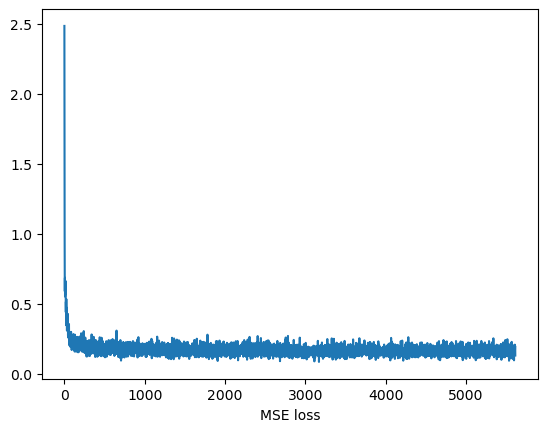

In [19]:
plt.plot(losses)
plt.xlabel('Iteration')
plt.xlabel('MSE loss')

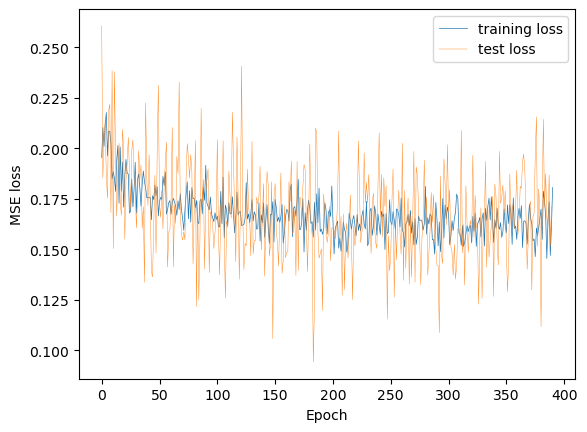

In [20]:
avg_losses=losses.reshape((-1,steps_per_epoch))

avg_losses=np.mean(avg_losses,axis=1)

burn_in=10

plt.plot(avg_losses[burn_in:], label='training loss',linewidth=0.5)
plt.plot(test_losses[burn_in:], label= 'test loss',linewidth=0.3)

plt.ylabel('MSE loss')
plt.xlabel('Epoch')
plt.legend()

In [21]:
def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / float(N)

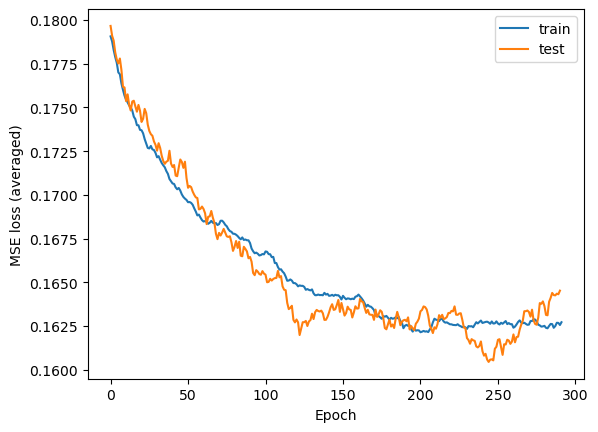

In [22]:
burnout = 10000
smoothing_parameter=100
smooth_test_losses=running_mean(test_losses,smoothing_parameter)
smooth_avg_losses=running_mean(avg_losses, smoothing_parameter)

plt.plot(smooth_avg_losses[burn_in:burnout], label='train')
plt.plot(smooth_test_losses[burn_in:burnout], label= 'test')
plt.xlabel('Epoch')
plt.ylabel('MSE loss (averaged)')
plt.legend()
plt.show()


**Overfitting checks and denoising capability**

In [104]:
batch_enumerate=enumerate(dataloader)

In [105]:
_,batch=next(batch_enumerate)
batch=batch.unsqueeze(1)

*Denoising capability*

In [106]:
noise = torch.randn(batch.shape).to(device)
test_noise=torch.randn(test_batch1.shape).to(device)

timesteps=torch.full((batch.shape[0],),N_STEPS//4).long().to(device)
test_timesteps=torch.full((test_batch1.shape[0],),N_STEPS//4).long().to(device)

if FLAGS.diffusion_mode == 'SigmaDDPM':
    noise = torch.fft.ifft2(model.sqrt_ps*torch.fft.fft2(noise)).real.to(device)
    test_noise = torch.fft.ifft2(model.sqrt_ps*torch.fft.fft2(test_noise)).real.to(device)

noisy_batch=model.add_noise(batch.to(device),noise,timesteps)
noisy_test_batch=model.add_noise(test_batch1,test_noise,test_timesteps)

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu!

In [ ]:
(model.sqrt_one_minus_alphas_cumprod/model.sqrt_alphas_cumprod)[250]

tensor(0.9580, device='cuda:0')

In [ ]:
noisy_batch  = noisy_batch[:16]

In [ ]:
gen,gen_mid=generate_image(model,16,1,SIZE,sample=noisy_batch.to(device),initial_timestep=N_STEPS//2)

100%|██████████| 500/500 [00:06<00:00, 71.48it/s]


Text(0.5, 0.98, 'Reconstruction Process for the whole dataset. Top-down: Baseline, Reconstructed, Intermediate step, Noisy Input (Baseline + Noise)')

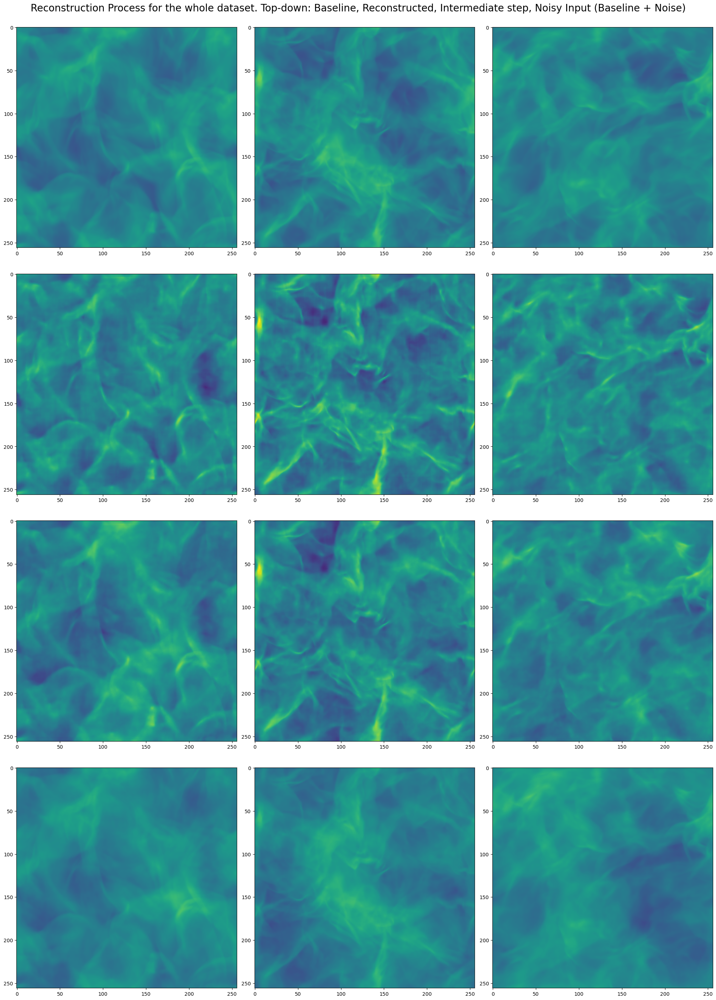

In [ ]:
fig=plt.figure(constrained_layout=True,figsize=(20,28))
ax= fig.subplots(4,3)

for i in range(3):
    ax[0,i].imshow(batch.cpu().detach()[i][0],vmin=amin,vmax=amax)
    ax[1,i].imshow(gen[i][0],vmin=amin,vmax=amax)
    ax[2,i].imshow(gen_mid[i][0],vmin=amin,vmax=amax)
    ax[3,i].imshow(noisy_batch.cpu().detach()[i][0],vmin=amin,vmax=amax)
fig.suptitle('Reconstruction Process for the whole dataset. Top-down: Baseline, Reconstructed, Intermediate step, Noisy Input (Baseline + Noise)', fontsize=20)
#plt.savefig('/_pdf/Reconstruction'+MODEL_ID+'.pdf')

In [ ]:
gen,gen_mid=generate_image(model,95,1,SIZE,sample=noisy_test_batch.to(device),initial_timestep=N_STEPS//2)

100%|██████████| 500/500 [00:37<00:00, 13.31it/s]


Text(0.5, 0.98, 'Reconstruction Process Test Batch. Top-down: Baseline, Reconstructed, Intermediate step, Noisy Input (Baseline + Noise)')

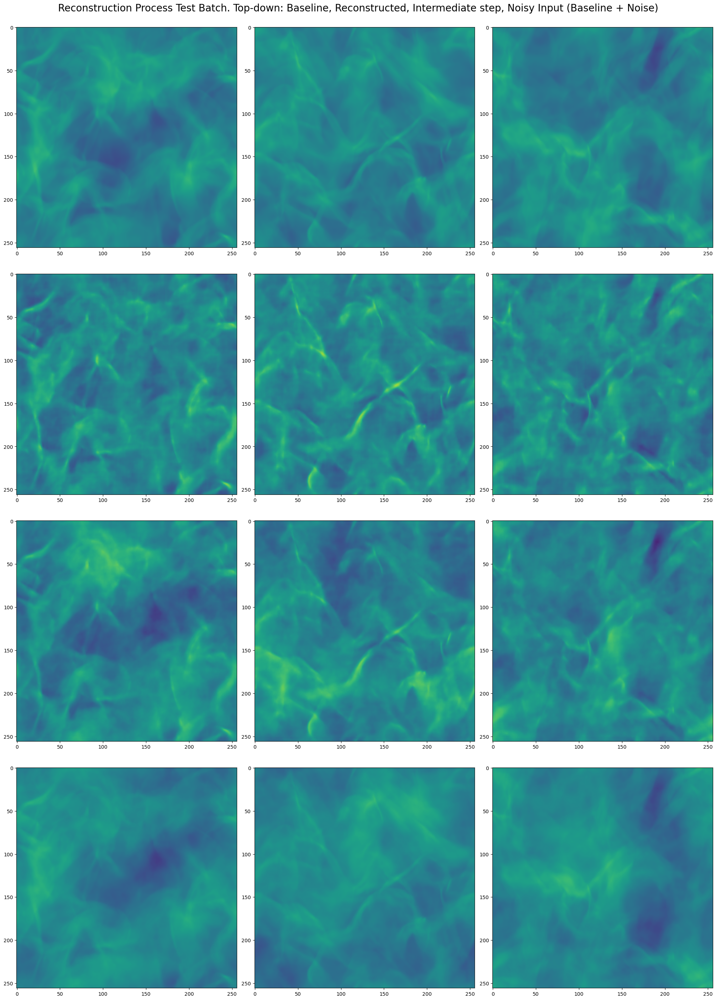

In [ ]:
fig=plt.figure(constrained_layout=True,figsize=(20,28))
ax= fig.subplots(4,3)

for i in range(3):
    ax[0,i].imshow(test_batch1.cpu().detach()[i][0],vmin=amin,vmax=amax)
    ax[1,i].imshow(gen[i][0],vmin=amin,vmax=amax)
    ax[2,i].imshow(gen_mid[i][0],vmin=amin,vmax=amax)
    ax[3,i].imshow(noisy_test_batch.cpu().detach()[i][0],vmin=amin,vmax=amax)
fig.suptitle('Reconstruction Process Test Batch. Top-down: Baseline, Reconstructed, Intermediate step, Noisy Input (Baseline + Noise)', fontsize=20)
#plt.savefig('/_pdf/Reconstruction_test_'+MODEL_ID+'.pdf')

*Summary statistics on denoised images*

In [ ]:
bins = np.linspace(0, np.pi, 100)

In [ ]:
base_power_spectra=np.concatenate([power_spectrum_iso(batch[i][0],bins=bins)[1].reshape(1,100) for i in range(batch.shape[0])],axis=0)

In [ ]:
noisy_power_spectra=np.concatenate([power_spectrum_iso(noisy_batch.cpu().detach()[i][0],bins=bins)[1].reshape(1,100) for i in range(batch.shape[0])],axis=0)

IndexError: index 16 is out of bounds for dimension 0 with size 16

In [ ]:
reconstructed_power_spectra=np.concatenate([power_spectrum_iso(gen[i][0],bins=bins)[1].reshape(1,100) for i in range(batch.shape[0])],axis=0)

IndexError: list index out of range

In [ ]:
mid_reconstructed_power_spectra=np.concatenate([power_spectrum_iso(gen_mid[i][0],bins=bins)[1].reshape(1,100) for i in range(batch.shape[0])],axis=0)

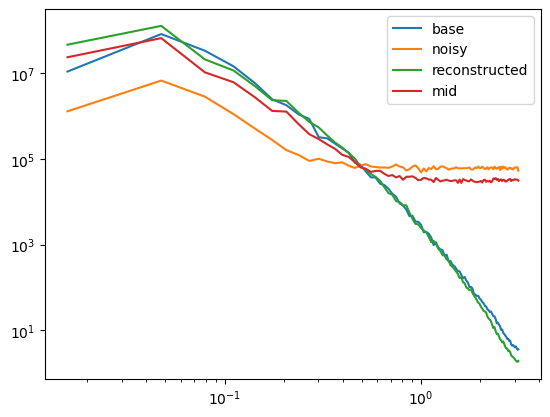

In [ ]:
plot_ps(bins,[base_power_spectra[0],noisy_power_spectra[0],reconstructed_power_spectra[0],mid_reconstructed_power_spectra[0]],labels=['base','noisy','reconstructed','mid'],show=True,save_name='MeanPowerSpectrum.pdf')

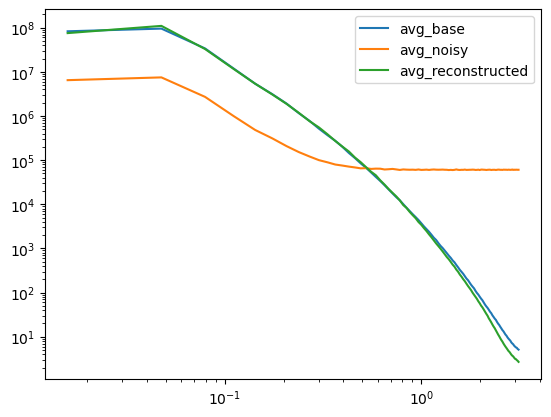

In [ ]:
plot_ps(bins,[np.mean(base_power_spectra,axis=0),np.mean(noisy_power_spectra,axis=0),np.mean(reconstructed_power_spectra,axis=0)],labels=['avg_base','avg_noisy','avg_reconstructed'],show=True)

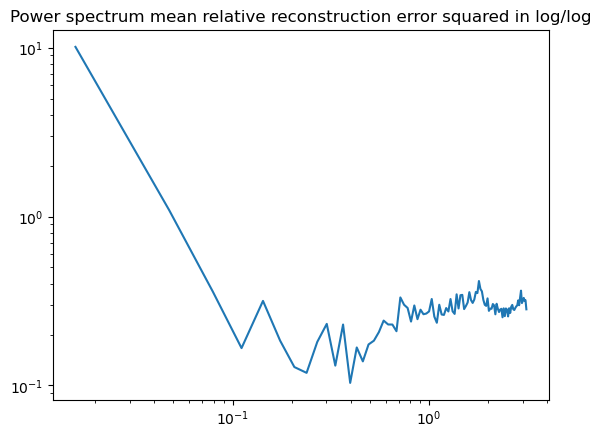

In [ ]:
bins_centers = (bins[:-1] + bins[1:])/2

fig, ax = plt.subplots(1, 1)
ax.plot(bins_centers, np.mean((1-reconstructed_power_spectra/base_power_spectra)**2,axis=0)[:-1])
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Power spectrum mean relative reconstruction error squared in log/log')
#plt.savefig('/_pdf/erreur_relative_reconstruction_ps_'+MODEL_ID+'.pdf')

MSE/PSNR as a function of timestep

*Reverse diffusion reconstruction process*

In [ ]:
def rescale(model, noisy_x, timesteps):
    """"Rescale add noise of the ddpm to have additive variance not preserved variance"""
    s1 = model.sqrt_alphas_cumprod[timesteps] 
    s1 = s1.reshape(-1,1,1,1)
    return  noisy_x/s1

In [ ]:
def denoising_measurement(model, batch, t):
    batch=batch.to(device)
    noise=torch.randn(batch.shape).to(device)

    timesteps=torch.full((batch.shape[0],), t).long().to(device)

    noisy_batch=model.add_noise(batch, noise, timesteps)

    rescaled_noisy_batch=rescale(model, noisy_batch, timesteps).to(device)
    
    mse_noisy=F.mse_loss(rescaled_noisy_batch, batch)

    gen,_=generate_image(model,len(noisy_batch),1,SIZE,sample=noisy_batch.to(device),initial_timestep=t)
    gen= torch.cat(gen, dim=0).to(device).unsqueeze(1)
    mse_reconstruct= F.mse_loss(gen, batch)

    return mse_noisy, mse_reconstruct

In [ ]:
times=list(range(0,100,10))+list(range(99,1099,100))

In [ ]:
mse_noisy_list=[]
mse_reconstruct_list=[]

In [ ]:
for t in times:
    mse_noise, mse_reconstruct= denoising_measurement(model, batch ,t)
    mse_noisy_list.append(mse_noise.detach().cpu().item())
    mse_reconstruct_list.append(mse_reconstruct.detach().cpu().item())

0it [00:00, ?it/s]
100%|██████████| 999/999 [04:37<00:00,  3.60it/s]


*One Step Reconstruction*

In [ ]:
def one_step_denoising_measurement(model, batch, t):
    batch=batch.to(device)
    noise=torch.randn(batch.shape).to(device)
    timesteps=torch.full((batch.shape[0],), t).long().to(device)
    noisy_batch=model.add_noise(batch, noise, timesteps)
    residual=model.reverse(noisy_batch, timesteps)

    s1 = model.sqrt_alphas_cumprod[timesteps] # bs
    s2 = model.sqrt_one_minus_alphas_cumprod[timesteps] # bs
    s1 = s1.reshape(-1,1,1,1) # (bs, 1, 1, 1) for broadcasting
    s2 = s2.reshape(-1,1,1,1) # (bs, 1, 1, 1)

    batch_denoised= (noisy_batch- s2* residual)/s1
    
    return F.mse_loss(batch_denoised, batch).detach().cpu().item()
    

In [ ]:
mse_reconstruct_one_step_list=[]

In [ ]:
for t in times:
    mse_reconstruct_one_step_list.append(one_step_denoising_measurement(model, batch, t))

In [ ]:
mse_noisy_list[0],mse_reconstruct_one_step_list[0],mse_reconstruct_list[0]

(9.999994654208422e-05, 4.1023511585080996e-05, 9.999232133850455e-05)

NameError: name 'times' is not defined

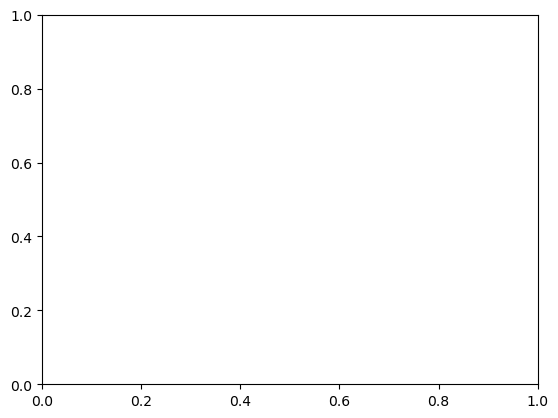

In [ ]:
fig, ax= plt.subplots(1,1)
ax.plot(times, mse_noisy_list, label='Noise amplitude')
ax.plot(times,mse_reconstruct_list, label='Reconstruction MSE')
ax.plot(times,mse_reconstruct_one_step_list, label='One step reconstruction MSE')
ax.plot(times,[1e-1 for t in times])
ax.legend()
ax.set_yscale('log')

fig.supylabel('MSE')
fig.supxlabel('Noising time step t')

In [ ]:
test_mse_noisy_list=[]
test_mse_reconstruct_list=[]
test_mse_reconstruct_one_step_list=[]

In [ ]:
for t in times:
    test_mse_reconstruct_one_step_list.append(one_step_denoising_measurement(model, test_batch, t))

In [ ]:
for t in times:
    mse_noise, mse_reconstruct= denoising_measurement(model, batch ,t)
    test_mse_noisy_list.append(mse_noise.detach().cpu().item())
    test_mse_reconstruct_list.append(mse_reconstruct.detach().cpu().item())

0it [00:00, ?it/s]
100%|██████████| 999/999 [02:33<00:00,  6.51it/s]


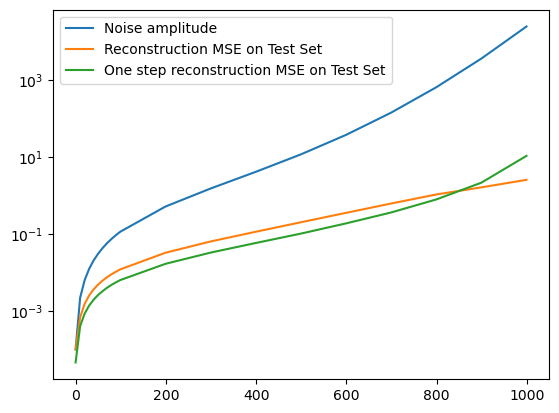

In [ ]:
fig, ax= plt.subplots(1,1)
ax.plot(times, test_mse_noisy_list, label='Noise amplitude')
ax.plot(times,test_mse_reconstruct_list, label='Reconstruction MSE on Test Set')
ax.plot(times,test_mse_reconstruct_one_step_list, label='One step reconstruction MSE on Test Set')
ax.legend()
ax.set_yscale('log')

fig.supylabel('MSE')
fig.supxlabel('Noising time step t')

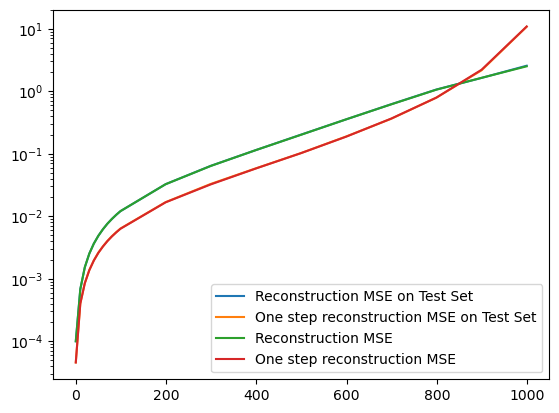

In [ ]:
fig, ax= plt.subplots(1,1)
ax.plot(times,test_mse_reconstruct_list, label='Reconstruction MSE on Test Set')
ax.plot(times,test_mse_reconstruct_one_step_list, label='One step reconstruction MSE on Test Set')
ax.plot(times,mse_reconstruct_list, label='Reconstruction MSE')
ax.plot(times,mse_reconstruct_one_step_list, label='One step reconstruction MSE')
ax.legend()
ax.set_yscale('log')


fig.supylabel('MSE')
fig.supxlabel('Noising time step t')

In [ ]:
def one_step_denoising(model, batch, t):
    batch=batch.to(device)
    noise=torch.randn(batch.shape).to(device)
    timesteps=torch.full((batch.shape[0],), t).long().to(device)
    noisy_batch=model.add_noise(batch, noise, timesteps)
    residual=model.reverse(noisy_batch, timesteps)

    s1 = model.sqrt_alphas_cumprod[timesteps] # bs
    s2 = model.sqrt_one_minus_alphas_cumprod[timesteps] # bs
    s1 = s1.reshape(-1,1,1,1) # (bs, 1, 1, 1) for broadcasting
    s2 = s2.reshape(-1,1,1,1) # (bs, 1, 1, 1)

    batch_denoised= (noisy_batch- s2* residual)/s1
    
    return noisy_batch, batch_denoised

In [ ]:
step1_noisy_test_batch, step1_recons_test_batch=one_step_denoising(model, test_batch, 500)

Text(0.5, 0.98, 'Reconstruction Process Test Batch. Top-down: Baseline, Reconstructed, Intermediate step, Noisy Input (Baseline + Noise)')

  0%|          | 0/500 [39:41<?, ?it/s]


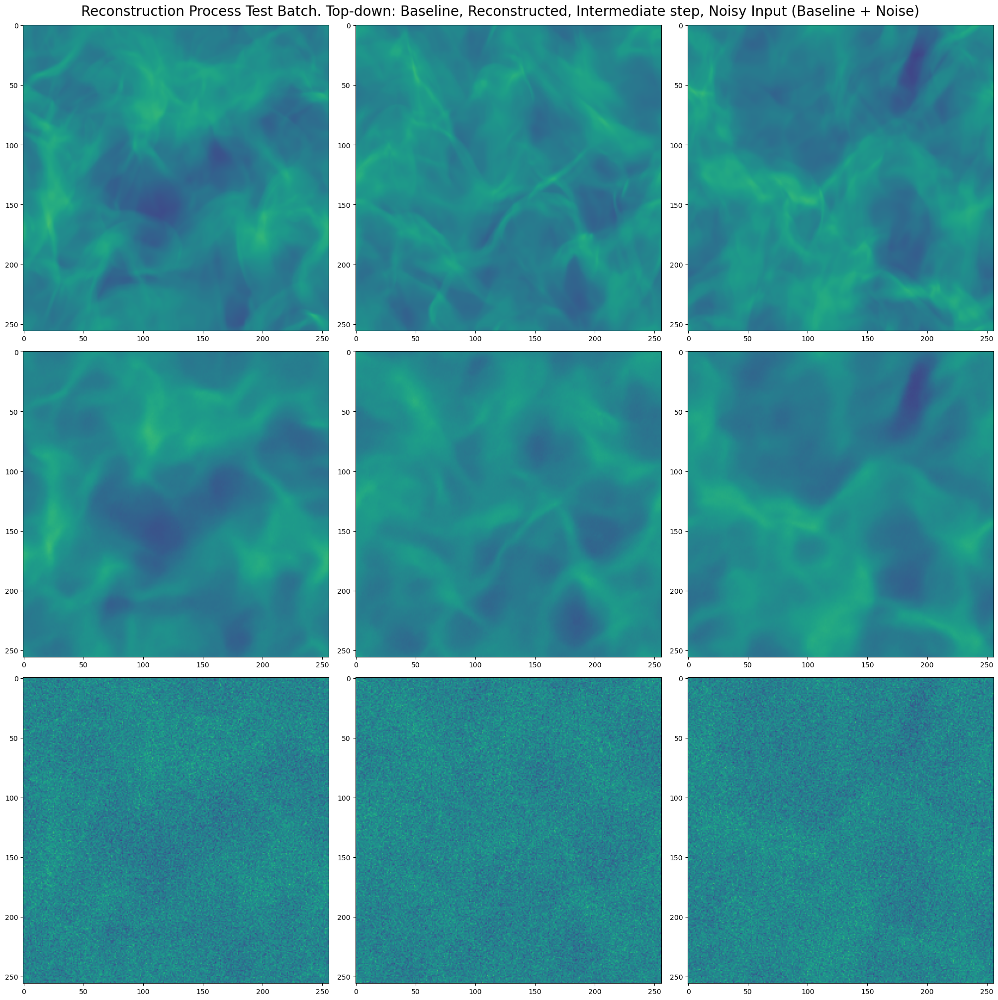

In [ ]:
fig=plt.figure(constrained_layout=True,figsize=(20,20))
ax= fig.subplots(3,3)

for i in range(3):
    ax[0,i].imshow(test_batch.cpu().detach()[i][0],vmin=amin,vmax=amax)
    ax[1,i].imshow(step1_recons_test_batch.cpu().detach()[i][0],vmin=amin,vmax=amax)
    ax[2,i].imshow(step1_noisy_test_batch.cpu().detach()[i][0],vmin=amin,vmax=amax)
fig.suptitle('Reconstruction Process Test Batch. Top-down: Baseline, Reconstructed, Intermediate step, Noisy Input (Baseline + Noise)', fontsize=20)
#plt.savefig('/_pdf/One_step_reconstruction_test'+MODEL_ID+'.pdf')

One step reconstruction empirically minimizes MSE compared to multi-step reconstruction (by diffusion) but leaves out detail....we should check power spectrums. One should also check what happens when doing the steps 1. without noise. 2 By Following the probability flow ODE (see Yang Song et al 2021 Score based generative modelling through SDE)

*Specific tests on the test set*

Diversity of sampling check
1. generate samples
2. Check them against one another
3. Check them against dataset


(Reveal a mode collapse?-> or not but do that by comparing two types of models with diff architecture)

In [ ]:
n_samples=RESULT_SAMPLE_SIZE

In [ ]:
samples=[np.load(os.path.join(SAMPLE_FOLDER,MODEL_ID,l_results[i]),allow_pickle=True) for i in range(RESULT_SAMPLE_SIZE)]

In [ ]:
np_samples=np.concatenate(samples).reshape(256,1,256,256)

In [ ]:
np_samples.shape

(256, 1, 256, 256)

In [ ]:
def correl(batch,second_batch=None):
    fft_b=np.fft.fft2(batch)
    if second_batch is None:
        return np.einsum('iabc,jabc->ijabc',fft_b,fft_b.conj())
    else:
        second_fft_b=np.fft.fft2(second_batch)
        return np.einsum('iabc,jabc->ijabc',fft_b,second_fft_b.conj())
    

Diversity of samples generated - dim 1 / Border periodic conditions

In [ ]:
indices = np.random.choice(256, size=10, replace=False)

In [ ]:
fourrier_correl=correl(np_samples, np_samples[indices])

In [ ]:
shifted_correl=np.fft.ifft2(fourrier_correl)

In [ ]:
t_norm=np.mean(np_samples**2,(2,3)).squeeze(1)

t_norm_sub=t_norm[indices]
t_norm_extended=np.einsum('i,j->ij',t_norm,t_norm_sub)
t_norm_extended=t_norm_extended.reshape((n_samples,10,1,1,1))

In [ ]:
shifted_correl=shifted_correl/np.sqrt(t_norm_extended)

/tmp/ipykernel_2078387/3378204787.py:1: RuntimeWarning: invalid value encountered in divide
  shifted_correl=shifted_correl/np.sqrt(t_norm_extended)


In [ ]:
closest=[]
for i in range(n_samples):
    max=0
    j_max=0
    idx=0
    for j in range(10):
        temp_max=np.max(shifted_correl[i][j].real)
        temp_idx=np.argmax(shifted_correl[i][j].real)
        if i!=indices[j] and temp_max>max:
            j_max=j
            max=temp_max
            idx=temp_idx
    closest.append((max,i,j_max,idx//256,idx%256))

In [ ]:
closest.sort(reverse=True)


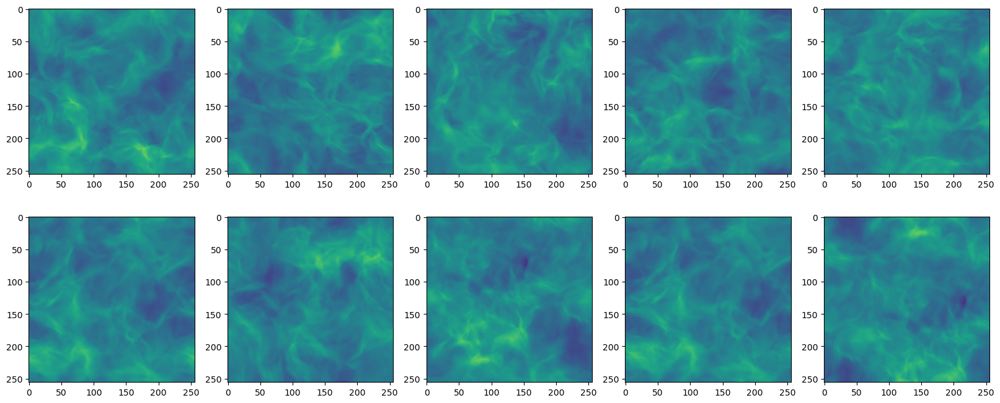

In [ ]:
fig, ax= plt.subplots(2,5,figsize=(20,8))
for i in range(5):
    _,idx,jdx,h1,h2=closest[i]
    ax[0,i].imshow(np_samples[idx][0], vmin=amin, vmax=amax)
    ax[1,i].imshow(np.roll(np_samples[indices][jdx][0],(h1,h2),axis=(0,1)), vmin=amin, vmax=amax)

Diversity of samples vs dataset

In [ ]:
batch.shape

torch.Size([256, 1, 256, 256])

In [ ]:
np_source_data=batch.numpy()

In [ ]:
np_source_data=np.concatenate([np.rot90(np_source_data,k,(2,3)) for k in range(4) ])

In [ ]:
t_norm_data=np.mean(np_source_data**2,(2,3)).squeeze(1)
t_norm_extended_data=np.einsum('i,j->ij',t_norm_data,t_norm_sub)
t_norm_extended_data=t_norm_extended_data.reshape((n_samples,10,1,1,1))

In [ ]:
fourrier_correl_data=correl(np_source_data, np_samples[indices])

In [ ]:
shifted_correl_data=np.fft.ifft2(fourrier_correl)/t_norm_extended_data

In [ ]:
closest=[]
for i in range(n_samples):
    max=0
    j_max=0
    idx=0
    for j in range(10):
        temp_max=np.max(shifted_correl_data[i][j].real)
        temp_idx=np.argmax(shifted_correl_data[i][j].real)
        if temp_max>max:
            j_max=j
            max=temp_max
            idx=temp_idx
    closest.append((max,i,j_max,idx//256,idx%256))

In [ ]:
closest.sort(reverse=True)

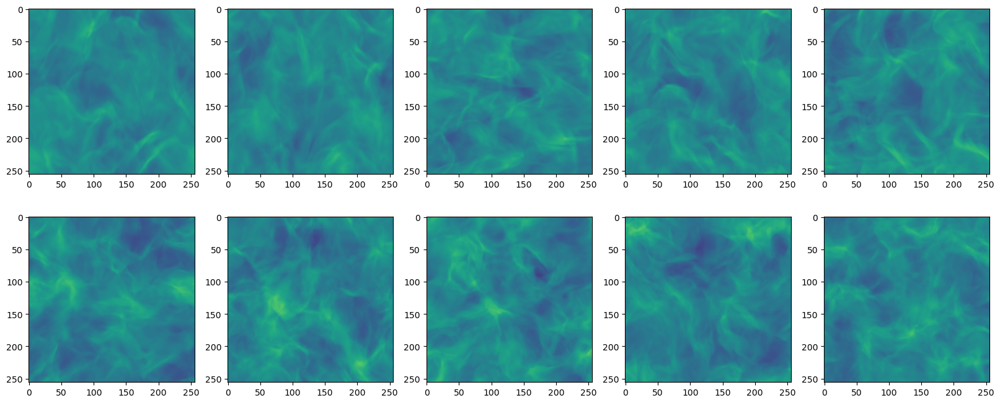

In [ ]:
fig, ax= plt.subplots(2,5,figsize=(20,8))
for i in range(5):
    _,idx,jdx,h1,h2=closest[i]
    ax[0,i].imshow(np_source_data[idx][0], vmin=amin, vmax=amax)
    ax[1,i].imshow(np.roll(np_samples[indices][jdx][0],(h1,h2),axis=(0,1)), vmin=amin, vmax=amax)

Correlation detection sanity check

In [ ]:
partial=np_source_data[indices]

shift_partial=partial.copy()
for i in range(10):
    shift_partial[i][0]=np.roll(partial[i][0], (10*i, 30*i))

In [ ]:
correl_check=correl(partial, shift_partial)

In [ ]:
t_norm_check=np.einsum('i,j->ij', t_norm_data[indices],t_norm_data[indices])

In [ ]:
shifted_correl_data=np.fft.ifft2(correl_check)/np.sqrt(t_norm_check).reshape(10,10,1,1,1)

In [ ]:
closest=[]
for i in range(10):
    max=0
    j_max=0
    idx=0
    for j in range(10):
        temp_max=np.max(shifted_correl_data[i][j].real)
        temp_idx=np.argmax(shifted_correl_data[i][j].real)
        if temp_max>max:
            j_max=j
            max=temp_max
            idx=temp_idx
    closest.append((max,i,j_max,idx//256,idx%256))

In [ ]:
closest.sort(reverse=True)

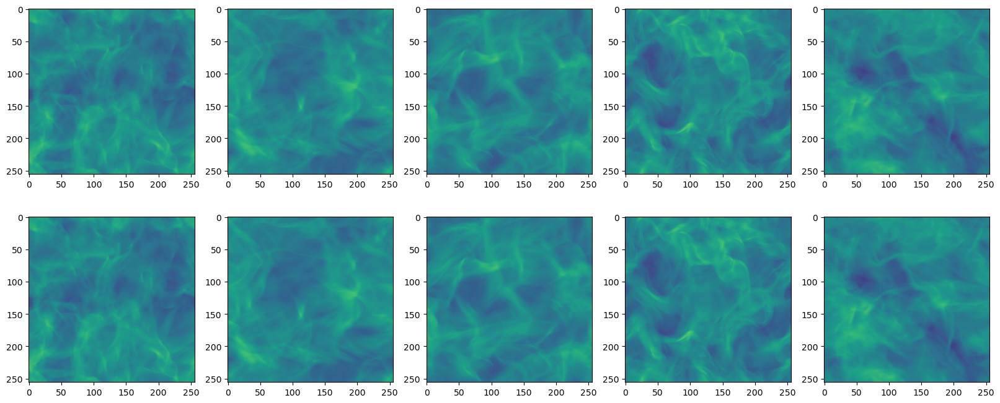

In [ ]:
fig, ax= plt.subplots(2,5,figsize=(20,8))
for i in range(5):
    _,idx,jdx,h1,h2=closest[i]
    ax[0,i].imshow(partial[idx][0], vmin=amin, vmax=amax)
    ax[1,i].imshow(np.roll(shift_partial[jdx][0],(h1,h2),axis=(0,1)), vmin=amin, vmax=amax)

If pictures above are not similar there is a problem in the implementation of the algorithm

In [ ]:
count=0
for _ in range(1000):
    count+=F.mse_loss(tgen[np.random.randint(256)][0],tgen[np.random.randint(256)][0]) ##Normalize by pixel?

count/1000


tensor(3.1999)

In [ ]:
count/1000/tgen.std()**2

tensor(2.0152)

In [ ]:
_,batch= next( enumerate(dataloader))

In [ ]:
batch=batch.unsqueeze(1)

In [ ]:
count=0
for _ in range(10000):
    count+=F.mse_loss(batch[np.random.randint(256)][0],batch[np.random.randint(256)][0]) ##Normalize by pixel?

count/10000/batch.std()**2


tensor(1.9920)

Diversity of sample generated, no PBC, highly random dataset (Planck Noise)

In [ ]:
test_batch1.shape

torch.Size([30, 2, 256, 256])

In [ ]:
def closest(im, dataset):
    l = len(dataset)
    dmin = F.mse_loss(dataset[0], im)
    pmin = dataset[0]
    for idx in range(l): ##Needed otherwise test points in the dataset are also taken in
        ptemp = dataset[idx]
        dtemp = F.mse_loss(ptemp, im)
        if dtemp < dmin:
            dmin = dtemp
            pmin = ptemp
    return pmin, dmin

In [ ]:
pmin, dmin = closest(test_batch1[0], dataset)

In [ ]:
distance = []
for basepoint in test_batch1:
    pmin, dmin = closest(basepoint, dataset)
    distance.append(dmin)

In [ ]:
np.mean(distance)

1.9168118

In [ ]:
from torch.distributions.chi2 import Chi2

In [ ]:
m = Chi2(256**2)

In [ ]:
stat_test = 2/256**2*m.sample((270, 30))

In [ ]:
stat_test.shape

torch.Size([270, 30])

In [ ]:
mini = stat_test.min(axis = 0)

In [ ]:
mini.values.mean()

tensor(1.9674)

In [ ]:
samples=[np.load(os.path.join(SAMPLE_FOLDER,MODEL_ID,l_results[i]),allow_pickle=True) for i in range(RESULT_SAMPLE_SIZE)]

In [ ]:
distance_samples = []
for basepoint in samples:
    pmin, dmin = closest(torch.from_numpy(basepoint), dataset)
    distance_samples.append(dmin)

In [ ]:
np.mean(distance_samples)

1.8667479